#  SINH MÔ TẢ CHO ẢNH
- CNN encoding-->Attention-->LSTM decoding

Xây dựng mô hình sinh mô tả cho ảnh với cơ chế chú ý 

Ví dụ:


![](https://miro.medium.com/max/640/0*ofxVvHhGt-RiMsK4.jpg)

__Caption:__ **A surfer riding on a wave.**


## Bài Toán:
Sinh mô tả cho ảnh là một nhiệm vụ rất gần với khả năng hiểu bức ảnh – một trong những nhiệm vụ chính của Thị giác máy tính. Mô hình không những phải xác định có những đối tượng nào trong một bức ảnh mà còn phải có khả năng biểu diễn mối quan hệ giữa các đối tượng qua một ngôn ngữ nào đó. Do đó, nhiệm vụ này từ lâu đã được xem là một vấn đề khó khăn đối với các thuật toán học máy, bởi vì nó đòi hỏi mô hình phải bắt trước được khả năng vượt trội của con người đó là trích xuất những thông tin nổi bật từ bức ảnh, diễn đạt ra một ngôn ngữ nào đó.

## Ứng dụng thực tế:



* Lái xe tự hành: Đây là một trong những thách thức lớn nhất trong ngành Trítuệ nhân tạo. Nếu chúng ta có những mô tả phù hợp cho những cảnh vật xung quanh chiếc xe, nó có thể mang lại một bước tiến cho hệ thống lái xe tự hành.

*  Trợ giúp người mù: Chúng ta có thể tạo ra một sản phẩm cho người mù, giúp họ đi trên đường mà không cần sự giúp đỡ của bất cứ ai khác. Chúng ta có thể làm điều đó bằng cách chuyển khung cảnh thành văn bản rồi từ văn bản chuyển thành giọng nói.
* Camera quan sát: Camera quan sát ở khắp mọi nơi, nhưng cùng với việc quan sát, liệu rằng chúng ta có thể tạo ra những mô tả tương ứng để cảnh báo một vụ trộm hoặc một hoạt động nguy hiểm nào đó.



* Truy vấn cơ sở dữ liệu hình ảnh: chúng ta có thể tìm những hình ảnh liên quan đến nội dung nào đó trong một tập cơ sở dữ liệu hình ảnh lớn.



	
	

Kiến trúc mô hình:
![](https://3qeqpr26caki16dnhd19sv6by6v-wpengine.netdna-ssl.com/wp-content/uploads/2017/10/Encoder-Decoder-Architecture-for-Neural-Machine-Translation.png)


## Cách thứ mô hình hoạt động : 
Ta sẽ đưa bức ảnh vào mạng CNN để trích xuất ra các đặc trưng, đặc trưng này là đặc trưng có độ sâu mức trừu tượng cao. Sau đó ta sẽ đẩy đặc trưng trừu tượng này vào mạng hồi quy để nó học sinh ra mô tả. Khi huấn luyện ta sẽ có một tập ảnh kèm theo mô tả sẵn. CNN có thể dùng một mạng đã huấn luyện sẵn, khi huấn luyện ta chỉ huấn luyện mạng RNN. Câu mô tả bắt đầu bằng từ start và kết thúc là từ stop, để đánh dấu bước bắt đầu và kết thúc. Bắt đầu nó sẽ sinh ra từ đầu tiên, sau đó sinh ra các từ tiếp theo tiếp theo, câu văn mô tả được đưa vào mô hình để huấn luyện. Sau khi học xong các trọng số, và dự đoán câu cho đến khi đoán được “stop” thì dừng lại.




In [1]:
#Mount với google drive để lấy dữ liệu
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
cd /content/drive/My Drive/Inception

/content/drive/My Drive/Inception



## Độ đo BLEU:



In [3]:
#Ví dụ về cách tính điểm BLEU
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import corpus_bleu

reference = [['this', 'a', 'test','of', 'cricket', 'match']]
candidate = ['this', 'is', 'a', 'test','of', 'cricket', 'match']
print("The cumulative and individual 1-gram BLEU use the same weights, e.g. (1, 0, 0, 0)")
print('Sentence Bleu 1-gram: %f' % sentence_bleu(reference, candidate, weights=(1, 0, 0, 0)))
print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(1, 0, 0, 0)))
print("\n")

print("The cumulative and individual 2-gram BLEU use the same weights, e.g. (0, 1, 0, 0)")
print('Sentence Bleu 2-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 1, 0, 0)))
print('Corpus Bleu 2-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 1, 0, 0)))
print("\n")

print("The cumulative and individual 3-gram BLEU use the same weights, e.g. (0, 0, 1, 0)")
print('Sentence Bleu 3-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 0, 1, 0)))
print('Corpus Bleu 3-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 0, 1, 0)))
print("\n")

print("The cumulative and individual 4-gram BLEU use the same weights, e.g. (0, 0, 0, 1)")
print('Sentence Bleu 4-gram: %f' % sentence_bleu(reference, candidate, weights=(0, 0, 0, 1)))
print('Corpus Bleu 4-gram: %f' % corpus_bleu([reference], [candidate], weights=(0, 0, 0, 1)))
print("\n")

print("The 2-gram weights assign a 50% to each of 1-gram and 2-gram")
print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.5, 0.5, 0, 0)))
print("\n")

print("3-gram weights are 33% for each of the 1, 2 and 3-gram scores")
print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.33, 0.33, 0.33, 0)))
print("\n")

print("4-gram weights are 25% for each of the 1, 2 3 and 4-gram scores")
print('Corpus Bleu 1-gram: %f' % corpus_bleu([reference], [candidate], weights=(0.25, 0.25, 0.25, 0.25)))

The cumulative and individual 1-gram BLEU use the same weights, e.g. (1, 0, 0, 0)
Sentence Bleu 1-gram: 0.857143
Corpus Bleu 1-gram: 0.857143


The cumulative and individual 2-gram BLEU use the same weights, e.g. (0, 1, 0, 0)
Sentence Bleu 2-gram: 0.666667
Corpus Bleu 2-gram: 0.666667


The cumulative and individual 3-gram BLEU use the same weights, e.g. (0, 0, 1, 0)
Sentence Bleu 3-gram: 0.600000
Corpus Bleu 3-gram: 0.600000


The cumulative and individual 4-gram BLEU use the same weights, e.g. (0, 0, 0, 1)
Sentence Bleu 4-gram: 0.500000
Corpus Bleu 4-gram: 0.500000


The 2-gram weights assign a 50% to each of 1-gram and 2-gram
Corpus Bleu 1-gram: 0.755929


3-gram weights are 33% for each of the 1, 2 and 3-gram scores
Corpus Bleu 1-gram: 0.702405


4-gram weights are 25% for each of the 1, 2 3 and 4-gram scores
Corpus Bleu 1-gram: 0.643459


# Import các thư viện phụ thuộc


In [4]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print(tf.__version__)

2.2.0


In [5]:
# Thêm các thư viện
import string
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend.tensorflow_backend import set_session
import keras
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd 
from PIL import Image
import pickle
from collections import Counter
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Using TensorFlow backend.


# Định nghĩa các hàm để load dữ liệu, xử lí dữ liệu text

In [ ]:
# Đọc file dữ liệu từ bộ nhớ
def load_doc(filename):
	# mở file
	file = open(filename, 'r')
	# đọc file
	text = file.read()
	# đóng file
	file.close()
	return text



# Hàm để Xóa các dấu chấm, phẩy
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)




# Hàm để xóa các từ chỉ có 1 chữ cái ví dụ như a,...
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# Hàm xóa các chữ số 1,2,3
def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

# Phân tích dữ liệu

In [13]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = 'Flicker8k_Dataset'
images = listdir(image_dir)


#kiểm tra có bao nhiêu file ảnh trong thư mục
print("The number of jpg flies in Flicker8k: {}".format(len(images)))

The number of jpg flies in Flicker8k: 16182


In [12]:
cd /content/drive/My Drive/Inception

/content/drive/My Drive/Inception


In [11]:
cd Flicker8k_Dataset/

/content/drive/.shortcut-targets-by-id/1gW_7c5D-vi2y5-rOpRnHQiDcAGXAgqu3/Flicker8k_Dataset


In [ ]:
ls

# Tạo một khung dữ liệu dùng thư viên Pandas cho dễ xử lí


---




In [ ]:
# Import thư viện pandas
import pandas as pd 
# tạo một frame dữ liệu
data = pd.read_csv('results.csv',delimiter='|') 

data.columns = ['filename', 'index','caption']

# sắp xếp lại thứ tự các cột
data = data.reindex(columns =['index','filename','caption'])


In [ ]:
data

,index,filename,caption
0,0,1000092795.jpg,Two young guys with shaggy hair look at their...
1,1,1000092795.jpg,Two young White males are outside near many b...
2,2,1000092795.jpg,Two men in green shirts are standing in yard
3,3,1000092795.jpg,man in blue shirt standing in garden
4,4,1000092795.jpg,Two friends enjoy time spent together
...,...,...,...
158910,0,998845445.jpg,A man in shorts and a Hawaiian shirt leans ov...
158911,1,998845445.jpg,"A young man hanging over the side of a boat ,..."
158912,2,998845445.jpg,A man is leaning off of the side of a blue an...
158913,3,998845445.jpg,"A man riding a small boat in a harbor , with ..."


Xóa các file ảnh có tên không hợp lện :
- Tất cả file ảnh nên có tên dạng "_.jpg"

In [ ]:
# Kiểm tra các tên file không hợp lệ
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

In [ ]:
invalid_filename_check(data)

In [ ]:
data = data[data['filename'] != '2199200615.jpg']

data = data[data['filename'] != '8025522249.jpg']

data = data[data['filename'] != '8196866291.jpg']
data = data[data['filename'] != '8083702960.jpg']

data = data[data['filename'] != '8083805102.jpg']

data = data[data['filename'] != '8084675052.jpg']


data = data[data['filename'] != '8084763287.jpg']

data = data[data['filename'] != '3391453209.jpg']

# Khám phá khung dữ liệu




In [ ]:
#Hàm thống kê dữ liệu
def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

In [ ]:
unique_filenames = utility_counter(data)

The number of unique file names : 31775
We can see that all the keys are having values count = 5
Counter({'1000092795.jpg': 5, '10002456.jpg': 5, '1000268201.jpg': 5, '1000344755.jpg': 5, '1000366164.jpg': 5, '1000523639.jpg': 5, '1000919630.jpg': 5, '10010052.jpg': 5, '1001465944.jpg': 5, '1001545525.jpg': 5, '1001573224.jpg': 5, '1001633352.jpg': 5, '1001773457.jpg': 5, '1001896054.jpg': 5, '100197432.jpg': 5, '100207720.jpg': 5, '1002674143.jpg': 5, '1003163366.jpg': 5, '1003420127.jpg': 5, '1003428081.jpg': 5, '100444898.jpg': 5, '1005216151.jpg': 5, '100577935.jpg': 5, '1006452823.jpg': 5, '100652400.jpg': 5, '1007129816.jpg': 5, '100716317.jpg': 5, '1007205537.jpg': 5, '1007320043.jpg': 5, '100759042.jpg': 5, '10082347.jpg': 5, '10082348.jpg': 5, '100845130.jpg': 5, '10090841.jpg': 5, '1009434119.jpg': 5, '1009692167.jpg': 5, '101001624.jpg': 5, '1010031975.jpg': 5, '1010087179.jpg': 5, '1010087623.jpg': 5, '10101477.jpg': 5, '1010470346.jpg': 5, '1010673430.jpg': 5, '101093029.j

In [ ]:
cd flickr30k_images/

/content/drive/My Drive/Inception/flickr30k_images


In [ ]:
ls

In [ ]:
cd /content/drive/My Drive/Inception

/content/drive/My Drive/Inception


In [ ]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = '/content/drive/My Drive/Inception/flickr30k_images'
images = listdir(image_dir)
print("The number of jpg flies in Flicker30k: {}".format(len(images)))

The number of jpg flies in Flicker30k: 63561


# Hiển thị một số dữ liệu


In [ ]:
#Hàm để vẽ ảnh từ tập dữ liệu và những mô tả của chúng.

def image_desc_plotter(data):
  npic = 5
  npix = 224
  target_size = (npix,npix,3)

  count = 1
  fig = plt.figure(figsize=(10,20))
  for jpgfnm in unique_filenames[20:25]:
      filename = image_dir + '/' + jpgfnm
      captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
      image_load = load_img(filename, target_size=target_size)
      
      ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
      ax.imshow(image_load)
      count += 1
      
      ax = fig.add_subplot(npic,2,count)
      plt.axis('off')
      ax.plot()
      ax.set_xlim(0,1)
      ax.set_ylim(0,len(captions))
      for i, caption in enumerate(captions):
          ax.text(0,i,caption,fontsize=20)
      count += 1
  plt.show()

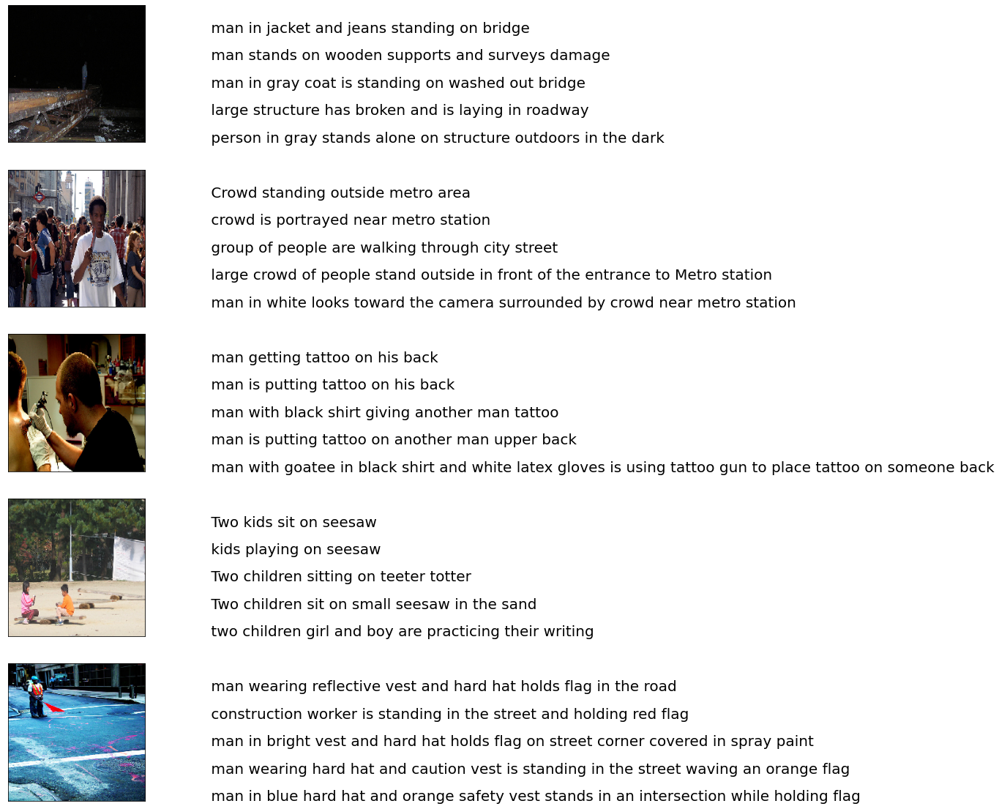

In [ ]:
image_desc_plotter(data)

#  Tiền xử lí dữ liệu





In [ ]:
#hàm tạo 1 bộ từ điển
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

In [ ]:

def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

In [ ]:
vocabulary = create_vocabulary(data)

Vocabulary Size : 23255


Thống Kê Tần số xuất hiện của các từ


In [ ]:
#Hàm để số lần xuất hiện của các từ
def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

In [ ]:
dfwordcount = df_word_count(data,vocabulary)

In [ ]:
#Top các từ xuất hiện nhiều nhất.
dfwordcount.iloc[:10,:]

,word,count
0,a,158397
1,.,132061
2,in,83203
3,A,78567
4,the,57384
5,on,45522
6,and,44233
7,is,41099
8,man,40271
9,of,38761


## Visualize  top 50 từ xuất hiện nhiều nhất và ít nhất


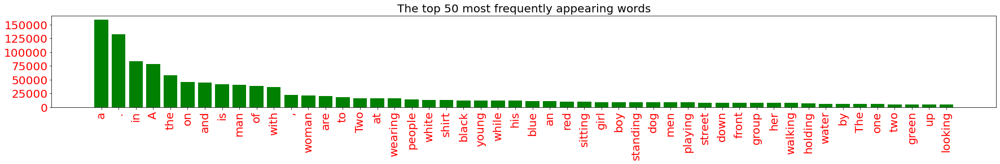

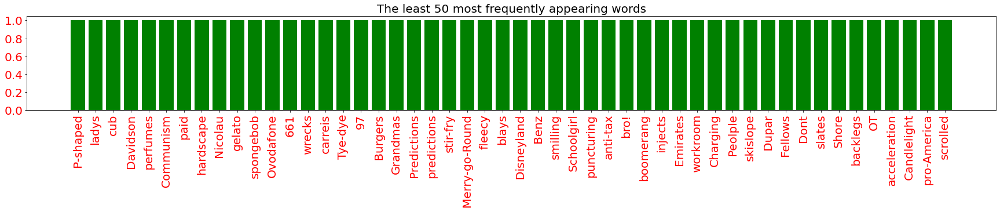

In [ ]:

topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(30,3))
    plt.bar(dfsub.index,dfsub["count"],color ='g')
    plt.yticks(fontsize=20,color ='r')
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20,color ='r')
    plt.title(title,fontsize=20)
    plt.show()

plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

## Làm sạch mô tả 
- Loại bỏ những từ như là "a", hoặc là các dấu chấm

- Loại bỏ những từ không chưa nhiều thông tin.

- Sử dụng những hàm đã được định nghĩa ở bên trên để làm sạch dữ liệu.

In [ ]:
#Hàm làm sạch dữ liệu
def text_clean(text_original):
  #xóa các dấu chấm, dấu phẩy
    text = remove_punctuation(text_original)
    #xóa các từ có 1 chữ cái như a,...
    text = remove_single_character(text)
    #xóa các số
    text = remove_numeric(text)
    return(text)
    
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [ ]:
#Tạo lại bộ từ điển sau khi đã được làm sạch dữ liệu
clean_vocabulary = create_vocabulary(data)

Vocabulary Size : 20925


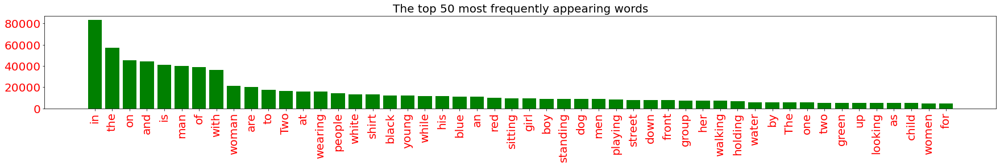

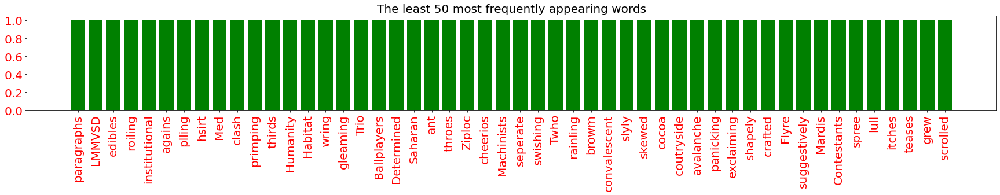

In [ ]:
#Visualize lại top 50 từ xuất hiện nhiều nhất và ít nhất.

dfwordcount = df_word_count(data,clean_vocabulary)
plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

## Tiền xử lí dữ liệu hình ảnh
- Thêm đường dẫn cho mỗi ảnh để load các ảnh lên một cách đồng thời từ file dữ liệu.

In [ ]:
#Hàm thêm đường dẫn cho ảnh
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir+"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector
all_img_name_vector = preprocess_images(data)
all_img_name_vector[:10]

['/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg',
 '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg']

## Tiền sử lí mô tả


*   Thêm các thẻ "start" và "end" vào đầu và cuối mỗi mô tả cho ảnh để mô hình biết được ở đâu là bắt đầu ở đâu là kết thúc của một chuỗi


In [ ]:
#Hàm tiền xử lí dữ liệu mô tả
def preprocess_captions(data):
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions
total_captions = preprocess_captions(data)
total_captions[:10]

['<start>  Two young guys with shaggy hair look at their hands while hanging out in the yard <end>',
 '<start>  Two young White males are outside near many bushes <end>',
 '<start>  Two men in green shirts are standing in yard <end>',
 '<start>  man in blue shirt standing in garden <end>',
 '<start>  Two friends enjoy time spent together <end>',
 '<start>  Several men in hard hats are operating giant pulley system <end>',
 '<start>  Workers look down from up above on piece of equipment <end>',
 '<start>  Two men working on machine wearing hard hats <end>',
 '<start>  Four men on top of tall structure <end>',
 '<start>  Three men on large rig <end>']

## Visualize một số ảnh trong tập dữ liệu

In [ ]:
ten_images = all_img_name_vector[:50] # Lấy 10 bức ảnh
unique_images = np.unique(ten_images)
print(unique_images)

In [ ]:
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread
#hàm vẽ bức ảnh
def showImagesHorizontally(ten_images):
    fig = figure()
    number_of_files = len(ten_images)
    for i in range(number_of_files):
        a=fig.add_subplot(1,number_of_files,i+1)
        image = imread(ten_images[i])
        imshow(image,cmap='Greys_r', aspect='equal', interpolation='nearest')
        axis('off')

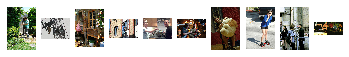

In [ ]:
showImagesHorizontally(unique_images)

In [ ]:
print("Total Images : " + str(len(all_img_name_vector)))
print("Total Captions : " + str(len(total_captions)))

Total Images : 158890
Total Captions : 158890


## Chỉ lấy 150000 ảnh và mô tả
- So that we can select batch size properly i.e. 625 batches if batch_size=64

In [ ]:
def data_limiter(num,total_captions,all_img_name_vector):
  # Trộn dữ liệu
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

In [ ]:
train_captions,img_name_vector = data_limiter(150000,total_captions,all_img_name_vector)

In [ ]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 150000 , Total images = 150000


## Lưu dữ liệu vào file pickle để có thể sử dụng lại lần sau

In [ ]:
from pickle import dump

# Ghi dữ liệu xuống file
dump(train_captions, open('captions.pkl', 'wb'))
dump(img_name_vector, open('img_names.pkl', 'wb'))

In [14]:
#Tải dữ liệu lên
train_captions = load(open('captions.pkl', 'rb'))
img_name_vector = load(open('img_names.pkl', 'rb'))

In [15]:
caption_val = load(open('val_captions.pkl', 'rb'))
img_name_val = load(open('val_img_names.pkl', 'rb'))

In [16]:
caption_test = load(open('test_captions.pkl', 'rb'))
img_name_test = load(open('test_img_names.pkl', 'rb'))

In [ ]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 150000 , Total images = 150000


## Kiểm tra kích thước của các ảnh

In [ ]:
# Hàm in ra kích thước của ảnh
def img_shape_finder(image):
  img= plt.imread(image)

  print("Shape of the image ==> {0} is ==> {1}".format(image.split('/')[1],img.shape))

In [ ]:
img_list=[]
for i in range(20):
  img_list.append(img_name_vector[i])

## Các ảnh cần được resize lại kích thước (299, 299, 3) để phù hợp với đầu vào của mạng Inception v3

Shape of the image:(333, 500, 3)


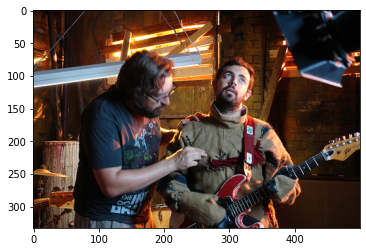

In [ ]:
# Kiểm tra kích thước của ảnh
def image_and_shapes(image):
  img= plt.imread(image)
  plt.imshow(img)
  print("Shape of the image:{}".format(img.shape))

image_and_shapes('/content/drive/My Drive/Colab/flickr30k_images/1000523639.jpg')

## Thử một số hàm làm giàu dữ liệu ảnh

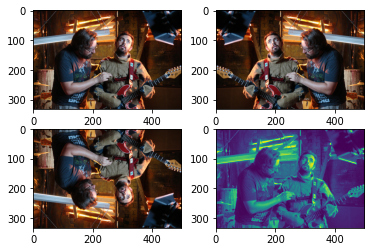

In [ ]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  
  plt.figure(1)

#Ảnh ban đầu

  plt.subplot(221)
  plt.imshow(original_img)

#Ảnh xoay trái- phải

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Ảnh xoay trên - xuống

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Ảnh xám

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper('/content/drive/My Drive/Colab/flickr30k_images/1000523639.jpg')


Resize lại kích thước ảnh

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (299, 299, 3)


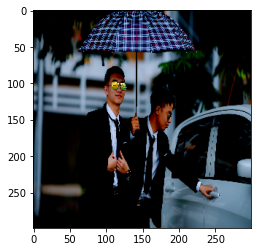

In [49]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path
img1,img1_path = load_image('/content/drive/My Drive/Inception/test/IMG_4094.jpg')
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Vẽ đồ thị Histograms
- Histogram của một hình ảnh cũng giống như histograms khác cũng cho thấy sự phân bố tần số. Nhưng biểu đồ hình ảnh hiển thị tần số của các giá trị cường độ điểm ảnh. Trong một biểu đồ hình ảnh, trục x hiển thị cường độ mức xám và trục y hiển thị tần số của cường độ. 

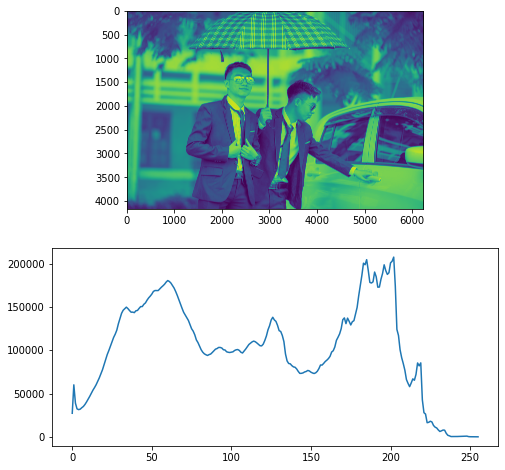

In [ ]:
# import thư việ opencv
import cv2 
# importing thư viện plot
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  # load ảnh 
  img = cv2.imread(image,0) 
  # Tìm các tần số của pixel trong khoảng 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms('/content/drive/My Drive/Inception/test/IMG_4094.jpg')

## Mô hình pre-trained cho ảnh (Inception V3)
	Định nghĩa mô hình pre-trained cho ảnh:
•	Mô hình được sử dụng ở đây là Inception v3. Inception v3 là một mạng tích chập được nghiên cứu bởi google. Mô hình này đã được huấn luyện trên tập dữ liệu cho bài toán phân loại ảnh với  1000 class khác nhau và đạt độ chính xác lên đến 93.9 %. Sử dụng mô hình tốt như Inception v3 giúp cho mô hình sinh mô tả ảnh có khả năng nhận diện được các đối tượng khác nhau trong ảnh tốt hơn, cho phép tạo ra các mô tả chi tiết và chính xác hơn. 


- Để có được sự tương ứng giữa các véc tơ đặc trưng và các phần của tấm ảnh 2D, chúng ta trích xuất đặc trưng từ tầng tích chập thấp hơn thay vì sử dụng cả lớp kết nối đầy đủ (fully connected layer). Điều này giúp cho Decoder tập chung có chọn lọc vào những phần cụ thể của bức ảnh bằng cách lựa chọn ra một tập con của tất cả các véc-tơ đặc trưng.

In [51]:
# load mô hình Inception V3 từ thư viện keras
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
#bỏ đi tầng cuối của mô hình InceptionV3
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
image_features_extract_model.summary()

## Trích xuất đặc trưng từ mô hình Inception v3

 


In [ ]:
img_name_vector

In [ ]:
# Loại bỏ những tên ảnh trùng nhau
encode_train = sorted(set(img_name_vector))
print(encode_train[:10])

['/content/drive/My Drive/Inception/flickr30k_images/1000092795.jpg', '/content/drive/My Drive/Inception/flickr30k_images/10002456.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1000268201.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1000344755.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1000366164.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1000523639.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1000919630.jpg', '/content/drive/My Drive/Inception/flickr30k_images/10010052.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1001465944.jpg', '/content/drive/My Drive/Inception/flickr30k_images/1001545525.jpg']


In [ ]:
#tạo ra tập dữ liệu mà các thành phần trong đó được cắt ra từ véc-tơ  chứa tên ảnh.
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)


## Map mỗi tên bức ảnh với hàm load bức ảnh đó lên. 

In [ ]:
# Feel free to change batch_size according to your system configuration
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(128)

## Sau tất cả các bước bức ảnh đã được resize về kích thước (299,299,3)

In [ ]:
#các elements của dataset có cấu trúc < ma trận ảnh, đường dẫn ảnh>
image_dataset

<BatchDataset shapes: ((None, 299, 299, 3), (None,)), types: (tf.float32, tf.string)>

In [ ]:
from tqdm import tqdm

- An NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [ ]:
for img, path in tqdm(image_dataset):
  # đầu ra có kích thước là (Batch_Size, 8, 8, 2048)
  batch_features = image_features_extract_model(img)
  # Reshape lại kích thước là (Batch_Size, 64, 2048)
  batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    #lưu file xuống google drive
    np.save(path_of_feature, bf.numpy())

249it [45:51, 11.05s/it]


In [ ]:
print(np_img)
print("Shape : {}".format(np_img.shape))

[[0.7555921  0.10535137 0.         ... 0.         1.1878283  0.05133845]
 [2.192422   0.         0.5397214  ... 0.         0.98265326 0.        ]
 [3.5808098  0.         0.         ... 0.         1.1083212  0.28665215]
 ...
 [0.         0.         0.         ... 0.         0.         0.40023074]
 [0.         0.         0.         ... 0.         0.         0.4033794 ]
 [0.11506022 0.         0.         ... 0.         0.         0.716787  ]]
Shape : (64, 2048)


## Chuẩn bị dữ liệu cho bộ giải mã DECODER(RNN)
  1. Ban đầu,tokenize toàn bộ mô tả. Bộ tokenizer từ thư viện NLTK giúp chúng ta xây dựng một bộ từ điển gồm các từ riêng biệt trong dataset.
  2. Giới hạn bộ từ điển với 12000 từ. Những từ không nằm trong từ điển sẽ được thay thế bằng thẻ < unk >.
  3. Đầu vào của RNN là các vec-tơ chứ không phải là các chuỗi. Nên ta cần chuyển đổi giữa các từ và địa chỉ tương ứng với index_to_word và word_to_index
  4. Padding các số 0 vào cuối các chuỗi để các chuỗi có độ dài như nhau

## Tokenizing mô tả và tạo từ điển

In [17]:
# Chọn 12000 xuất hiện nhiều nhất trong từ điển.
top_k = 12000

def tokenize_caption(top_k,train_captions):

  # Chọn 12000 xuất hiện nhiều nhất trong từ điển.
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
 
  
  tokenizer.fit_on_texts(train_captions)

  #chuyển text thành chuỗi số
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'
  train_seqs = tokenizer.texts_to_sequences(train_captions)


  return train_seqs, tokenizer



# dữ liệu train
train_seqs , tokenizer = tokenize_caption(top_k,train_captions)

In [18]:
# tập validate
seq_val = tokenizer.texts_to_sequences(caption_val)

In [19]:
# tập test
seq_test = tokenizer.texts_to_sequences(caption_test)

In [ ]:
train_captions[:3]

['<start>  Carnival games at place called Giorgio with stuffed animals hanging from the ceiling <end>',
 '<start>  man in blue shirt welding <end>',
 '<start>  homeless man begging for money using humorous sign <end>']

In [ ]:
train_seqs[:3] # Các câu mô tả đã được chuyển thành các chuỗi số

[[2, 917, 1584, 17, 631, 1520, 7358, 11, 862, 1157, 315, 62, 5, 1480, 3],
 [2, 8, 4, 26, 22, 1323, 3],
 [2, 1204, 8, 4324, 52, 1184, 203, 5469, 197, 3]]

-  Ở đây kích thước của mỗi mô tả là khác nhau nên chúng ta cần phải padding cho véc tơ mô tả có độ dài bằng với độ dài lớn nhất của chuỗi.


In [ ]:
# oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
tokenizer.oov_token

'<unk>'

In [ ]:
tokenizer.index_word

In [ ]:
tokenizer.word_counts

### Tìm độ dài lớn nhất và nhỏ nhất của chuỗi

In [20]:
# Tìm độ dài lớn nhất.
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

max_length = calc_max_length(train_seqs)


In [21]:
# Tìm độ dài nhỏ nhất của chuỗi
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
min_length = calc_min_length(train_seqs)

In [22]:
print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 74 : 3


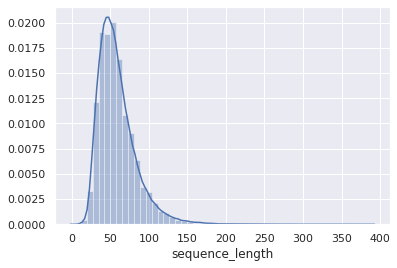

In [ ]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

##  Padding mỗi véc-tơ với độ dài lớn nhất của chuỗi để tất cả các vec-tơ mô tả đều có cùng độ dài.



In [23]:
#Hàm padding
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

In [24]:
padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post')
print(padded_caption_vector.shape)

(150000, 74)


In [25]:
padded_caption_val = padding_train_sequences(seq_val,max_length,'post')

In [ ]:
print(padded_caption_val.shape)

(30000, 74)


In [26]:
padded_caption_test = padding_train_sequences(seq_test,max_length,'post')
print(padded_caption_test.shape)

(5000, 74)


In [27]:

# Tạo các tập train, validate, test
img_name_train = img_name_vector
caption_train = padded_caption_vector

img_name_val =  img_name_val
caption_val = padded_caption_val

img_name_test = img_name_test
caption_test = padded_caption_test

In [ ]:
print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("val Data : X = {0},Y = {1}".format(len(img_name_val), len(caption_val)))
print("test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 150000,Y = 150000
val Data : X = 30000,Y = 30000
test Data : X = 5000,Y = 5000


Thông số của mô hình

In [28]:

BATCH_SIZE = 256
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# kích thước của vec-tơ tríc xuất đặc trưng được lấy ra từ mô hình Inception v3 là (64, 2048)
features_shape = 2048
attention_features_shape = 64

In [29]:
val_num_steps = len(img_name_val) // BATCH_SIZE
val_num_steps

117

In [30]:
# Load véc-tơ đặc trưng của ảnh
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [31]:
# Tạo tập dataset
def create_dataset(img_name_train,cap_train):

  
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

  # sử dụng map để load các file chưa các véc tơ đặc trưng một cách song song
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Trộn dữ liệu và chia theo lô
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

  return dataset

In [32]:
# tạo dataset cho tập train
dataset = create_dataset(img_name_train,caption_train)
# tạo dataset cho tập validate
val_dataset = create_dataset(img_name_val,caption_val)



## Xây dựng mô hình sinh mô tả cho ảnh với cơ chế chú ý


In [33]:
# Mô hình attetion xây dựng dựa trên bài báo của tác giả BahdanauAttention

class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    
    # Kích thươc của véc-tơ features(đầu ra của CNN_encoder) == (batch_size, 64, embedding_dim)
    # Kích thước của véc-tơ hidden  == (batch_size, hidden_size)

    # Mở rộng kích thước cho hidden tại axis = 1
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

    # attention_weights shape == (batch_size, 64, 1)
    # Tính giá trị hàm soft max cho self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [34]:
# Mô hình Encoder(CNN)

class CNN_Encoder(tf.keras.Model):
    
    # Bởi vì những đặc trưng đã được trích xuất và lưu ở file pickle
    # Nên ta truyền những đặc trưng này vào mạng CNN_Encoder thông qua một tầng kết nối đầy đủ
    
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [35]:
# Mô hình DecoderRNN
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()

    # số lượng units trong RNN
    self.units = units

    # Tầng embedding để chuyển word thành véc-tơ
    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

    
        
    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)



  def call(self, x, features, hidden):
    # Định nghĩa mô hình attention như là một mô hình riêng biệt
    context_vector, attention_weights = self.attention(features, hidden)

    # Kích thước của x sau khi truyền vào tầng word_embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # Truyền đầu vào hoàn chỉnh vào mạng  GRU
    output, state = self.gru(x)

    # shape == (batch_size, 1, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * 1, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    
    # Thêm tầng dropout chống overfit và tầng batch_normalization
    x = self.dropout(x)
    x = self.batchnormalization(x)

    # output shape == (batch_size * 1, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

 # reset hidden state
  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [36]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [37]:
# Thuật toán tối ưu sử dụng là Adam
optimizer = tf.keras.optimizers.Adam()

# hàm mất mát là sparse categorical Crossentropy
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))

  #Tính cross_entropy = - log(probability of real_word)
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask
  # giá trị trung bình của hàm lỗi theo lô
  return tf.reduce_mean(loss_)

Checkpoint


In [ ]:
rm -rf ./checkpoints/train

In [ ]:
rm -rf logs/

In [ ]:
ls

In [38]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

In [ ]:
ckpt_manager.checkpoint

In [ ]:
ckpt_manager.checkpoints

['./checkpoints/train/ckpt-14',
 './checkpoints/train/ckpt-15',
 './checkpoints/train/ckpt-16',
 './checkpoints/train/ckpt-17',
 './checkpoints/train/ckpt-18',
 './checkpoints/train/ckpt-19',
 './checkpoints/train/ckpt-20']

In [ ]:
ckpt_manager.latest_checkpoint

'./checkpoints/train/ckpt-20'

In [39]:
ckpt.restore('./checkpoints/train/ckpt-19')

In [40]:
start_epoch = 0

In [41]:
import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
val_log_dir = 'logs/gradient_tape/' + current_time + '/val'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)

Training


In [42]:

loss_plot = []

In [43]:
# cho phép complie ra đồ thì tính toán tĩnh
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # Khởi tạo hidden state cho mỗi batch
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

#xây dựng đồ thị tính toán động
  with tf.GradientTape() as tape:
      # trích xuất đặc trưng từ encoder
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # sử dụng kĩ thuật teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

#tính toán lan truyền ngược với hàm loss và các tham số
  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [44]:
val_loss_plot = []

@tf.function
def val_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
EPOCHS = 360

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)


             
    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss/ num_steps), step=epoch)







    #For val
    #================================================================
    total_loss_val = 0
    for (batch, (img_tensor, target)) in enumerate(val_dataset):
        batch_loss, t_loss = val_step(img_tensor, target)
        total_loss_val += t_loss
    # storing the epoch end loss value to plot later
    val_loss_plot.append(total_loss_val / val_num_steps) 

    # Tensorboard 
    with val_summary_writer.as_default():
      tf.summary.scalar('LossPlotVal', (total_loss_val/ val_num_steps), step=epoch)

    ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} ValLoss {:.6f}'.format(epoch + 1,(total_loss/num_steps),(total_loss_val/val_num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 0.2540
Epoch 1 Batch 100 Loss 0.2131
Epoch 1 Batch 200 Loss 0.2328
Epoch 1 Batch 300 Loss 0.2616
Epoch 1 Batch 400 Loss 0.2393
Epoch 1 Batch 500 Loss 0.2350
Epoch 1 TrainLoss 0.230975 ValLoss 0.124061
Time taken for 1 epoch 13207.097960233688 sec

Epoch 2 Batch 0 Loss 0.2188
Epoch 2 Batch 100 Loss 0.2309
Epoch 2 Batch 200 Loss 0.2151
Epoch 2 Batch 300 Loss 0.2338
Epoch 2 Batch 400 Loss 0.2435
Epoch 2 Batch 500 Loss 0.2377
Epoch 2 TrainLoss 0.228561 ValLoss 0.123527
Time taken for 1 epoch 11521.210737228394 sec

Epoch 3 Batch 0 Loss 0.2144
Epoch 3 Batch 100 Loss 0.2401
Epoch 3 Batch 200 Loss 0.2302
Epoch 3 Batch 300 Loss 0.2274


In [ ]:
print(caption_train[:2,:].shape)
print(caption_train[:2].shape)
print(caption_train)
print(caption_train.shape)

print(caption_train[:].shape)
        

(2, 74)
(2, 74)
[[   2  917 1584 ...    0    0    0]
 [   2    8    4 ...    0    0    0]
 [   2 1204    8 ...    0    0    0]
 ...
 [   2   16   14 ...    0    0    0]
 [   2  843    7 ...    0    0    0]
 [   2 1823  101 ...    0    0    0]]
(150000, 74)
(150000, 74)


In [ ]:
ckpt_manager.save()

'./checkpoints/train/ckpt-25'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

Caption!
The evaluate function is similar to the training loop, except you don't use teacher forcing here. The input to the decoder at each time step is its previous predictions along with the hidden state and the encoder output.
Stop predicting when the model predicts the end token.
And store the attention weights for every time step.

In [45]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [46]:
def beamEvaluate(image, beam_index = 3):

  start = [tokenizer.word_index['<start>']]

  hidden = decoder.reset_state(batch_size=1)

  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

  features = encoder(img_tensor_val)
  

  
  result = [[start, 0.0,hidden]]

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)


  while len(result[0][0]) < max_length:
    temp = []
    for s in result:
      dec_input =  tf.expand_dims([s[0][-1]], 0)
      hidden = s[2]
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      x=tf.nn.softmax(predictions)
      log = tf.math.log(x)
      word_preds = np.argsort(log[0])[-beam_index:]


      for w in word_preds:
        next_cap, prob = s[0][:], s[1]
        next_cap.append(w)
        prob +=  log[0][w]
        temp.append([next_cap, prob, hidden])
    result = temp
    result = sorted(result, reverse=False, key=lambda l: l[1])
    result = result[-beam_index:]
  

  result = result[-1][0]
  intermediate_caption = [tokenizer.index_word[i] for i in result]
  final_caption = []
  for i in intermediate_caption:
    if ( i != '<end>'):
      final_caption.append(i)
    else:
      break

  
  final_caption = (final_caption[1:])
  return final_caption


In [47]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

65536/64400 [==============================] - 0s 4us/step
Prediction Caption: man on white surfboard rides his balance <end>


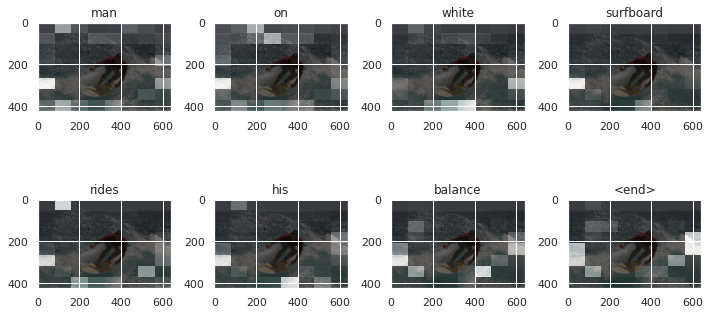

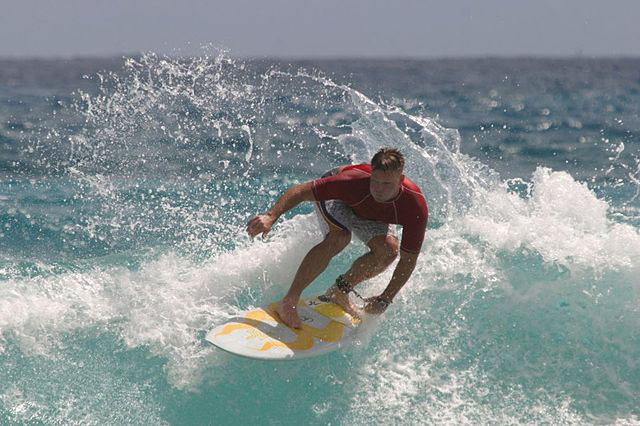

In [ ]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     origin=image_url)

result, attention_plot = evaluate(image_path)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

Prediction Caption: man on blue wetsuit is balance on white water
time took to Predict: 3 sec


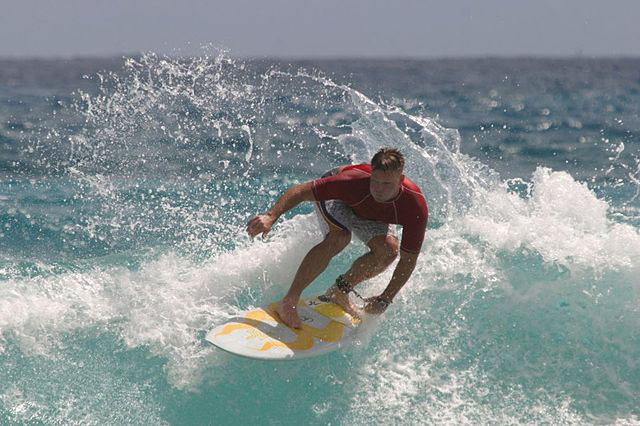

In [ ]:

start = time.time()

result = beamEvaluate(image_path)


#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)

print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(image_path)

Flicker8k_Dataset/2854207034_1f00555703.jpg
BELU score: 0
Real Caption: person lies on the grass with shopping cart nearby
Prediction Caption: two people are lying in park


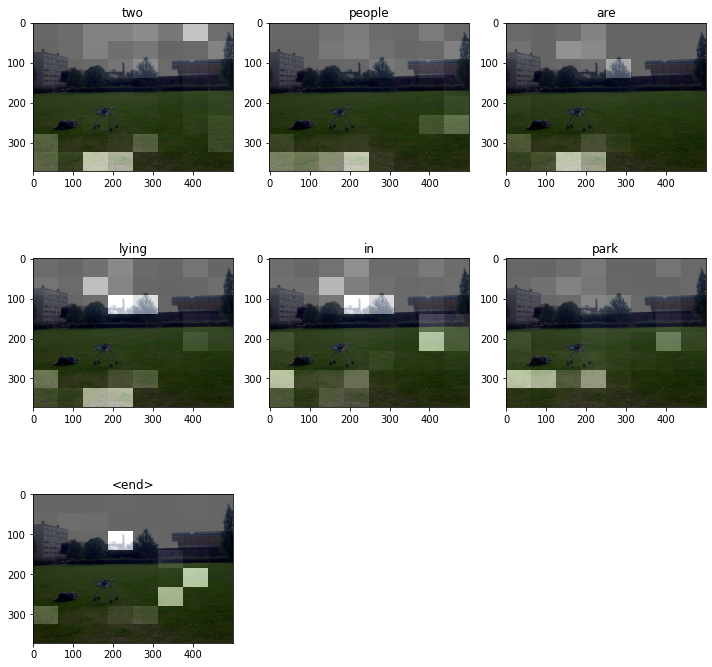

time took to Predict: 4 sec


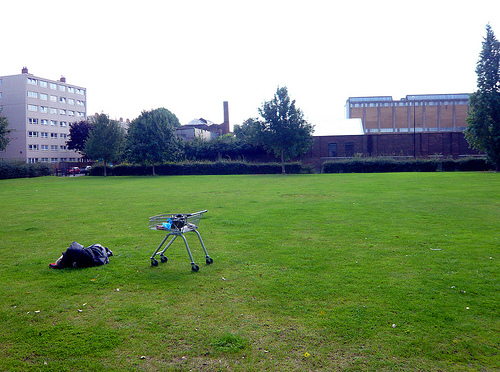

In [53]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 0
Real Caption: person lies on the grass with shopping cart nearby
Prediction Caption: man lying in park
time took to Predict: 3 sec


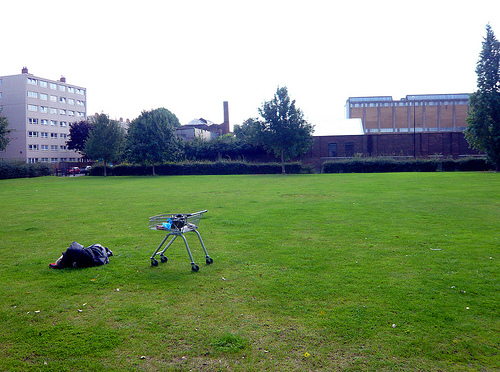

In [54]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/3416091866_a96003d652.jpg
BELU score: 12.76905697040564
Real Caption: <unk> haired man is doing demonstration in front of small crowd of people
Prediction Caption: man in the red shirt


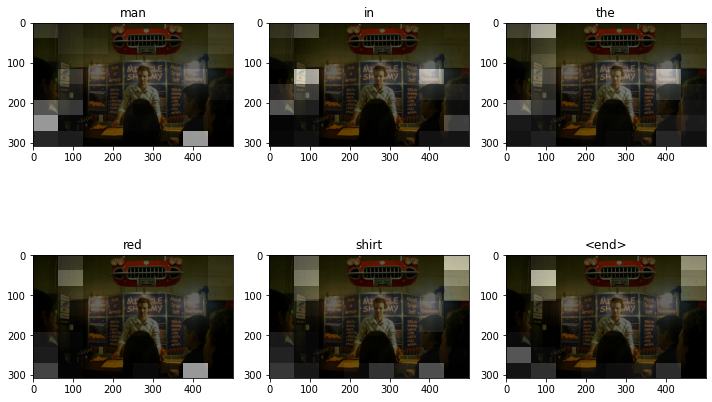

time took to Predict: 1 sec


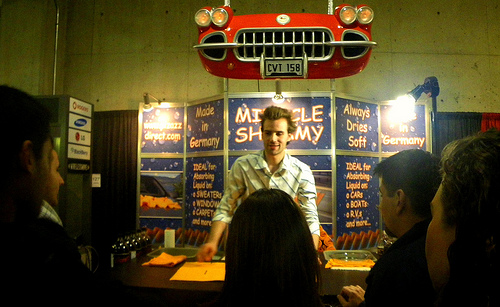

In [77]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 9.847434582895442
Real Caption: <unk> haired man is doing demonstration in front of small crowd of people
Prediction Caption: man is standing in the background
time took to Predict: 3 sec


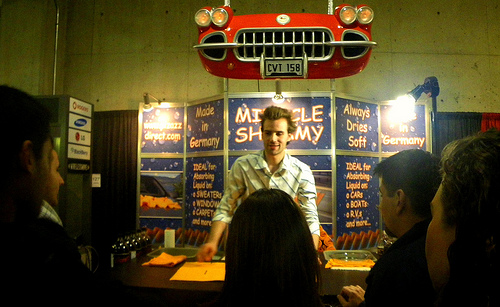

In [78]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/3119875880_22f9129a1c.jpg
BELU score: 0
Real Caption: kids play in rocky area
Prediction Caption: young boys are rock climbing rock


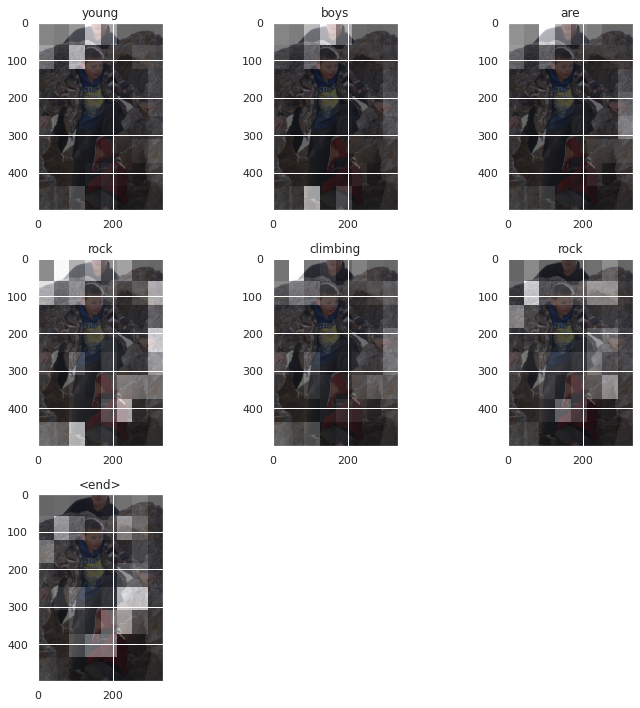

time took to Predict: 2 sec


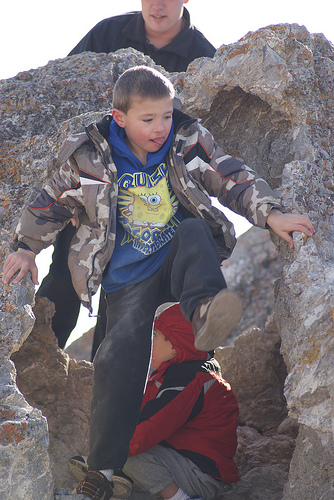

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0))
print(f"BELU score: {score*100}")


score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

score = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.33, 0))
print(f"BELU score: {score*100}")


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 25.307989573458556
Real Caption: brown dog and black and white dog are running over grassy hills
Prediction Caption: two dogs are running in grassy field
time took to Predict: 3 sec


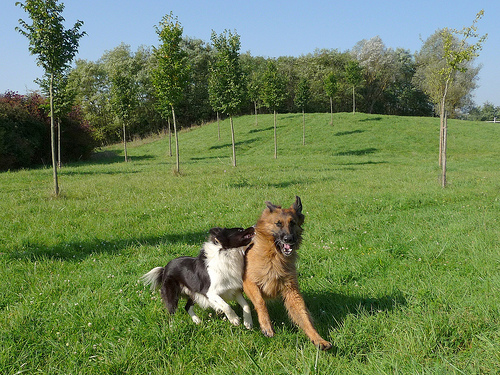

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()





print(f"BELU score: {sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/745880539_cd3f948837.jpg
BELU score: 35.83129187641354
Real Caption: white dog emerges from yellow tube on an obstacle course
Prediction Caption: small dog is jumping out of yellow tube in wooden chair for the camera


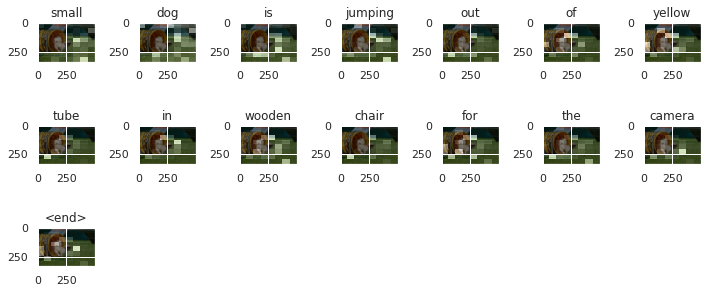

time took to Predict: 4 sec


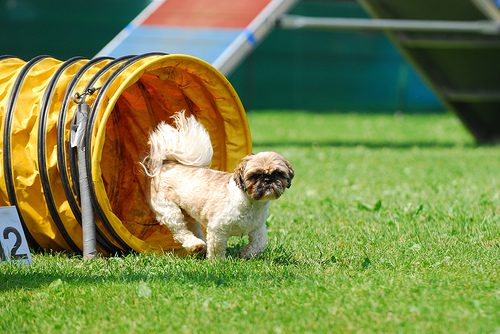

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 51.3417119032592
Real Caption: white dog emerges from yellow tube on an obstacle course
Prediction Caption: white dog emerges from yellow tube
time took to Predict: 3 sec


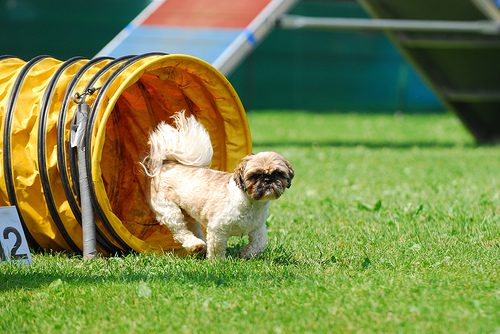

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/352382023_7605223d1c.jpg
BELU score: 60.80253214198359
Real Caption: dog with stick in his mouth walking through water
Prediction Caption: tan dog is running through some water


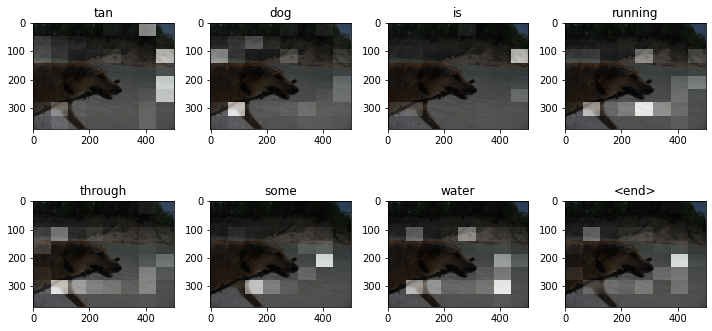

time took to Predict: 32 sec


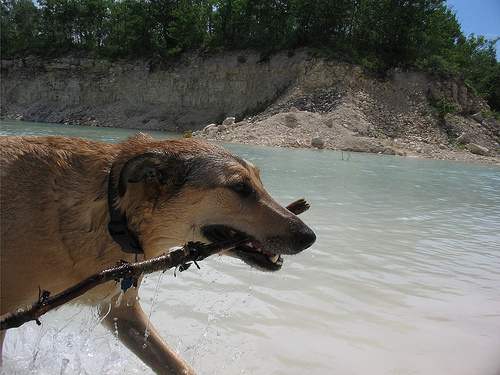

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/2950905787_f2017d3e49.jpg
BELU score: 29.256375127882826
Real Caption: snow covered mountains with person walking up in the background
Prediction Caption: man stands on the mountains


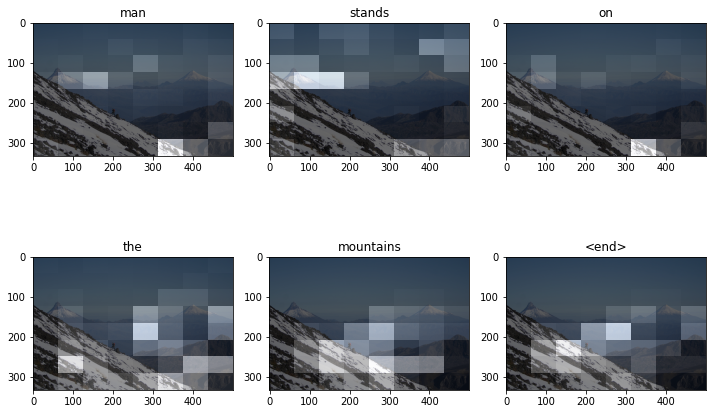

time took to Predict: 2 sec


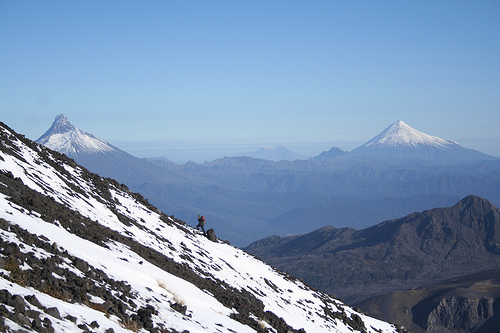

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 0
Real Caption: snow covered mountains with person walking up in the background
Prediction Caption: man is standing on mountain
time took to Predict: 3 sec


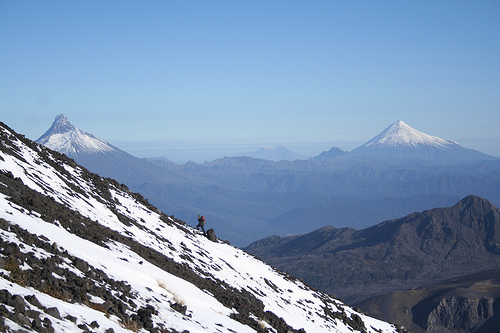

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/2073105823_6dacade004.jpg
BELU score: 0
Real Caption: snowboarder rides down handrail without snow
Prediction Caption: boy is jumping long path


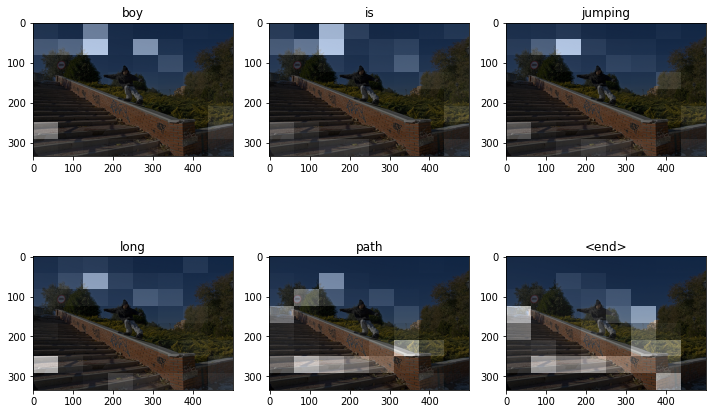

time took to Predict: 2 sec


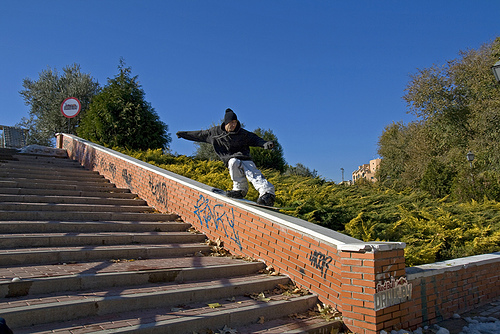

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 36.61475238303926
Real Caption: snowboarder rides down handrail without snow
Prediction Caption: man is skating down railing
time took to Predict: 3 sec


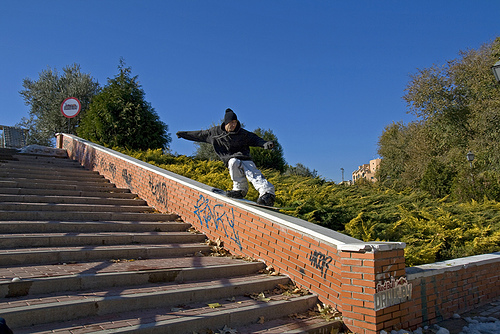

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/2501595799_6316001e89.jpg
BELU score: 43.668354428478125
Real Caption: young boy wearing red swimsuit jumps into blue kiddie pool
Prediction Caption: little boy wearing red shorts holds yellow ball in blue kiddie pool


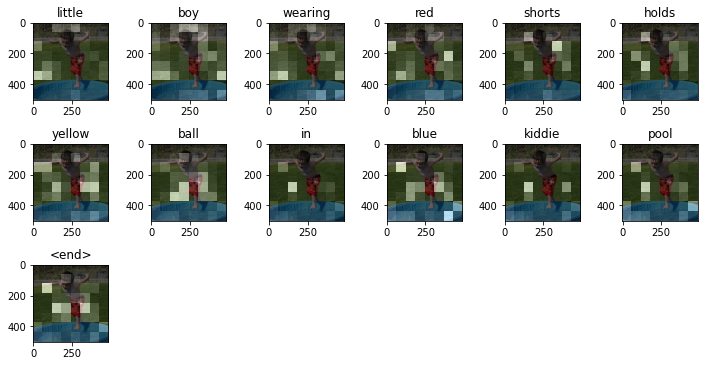

time took to Predict: 27 sec


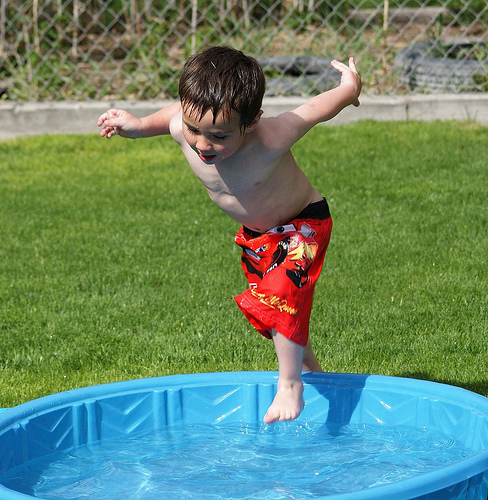

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 44.741965840718485
Real Caption: young boy wearing red swimsuit jumps into blue kiddie pool
Prediction Caption: little boy in red swimsuit jumps into paddling pool
time took to Predict: 3 sec


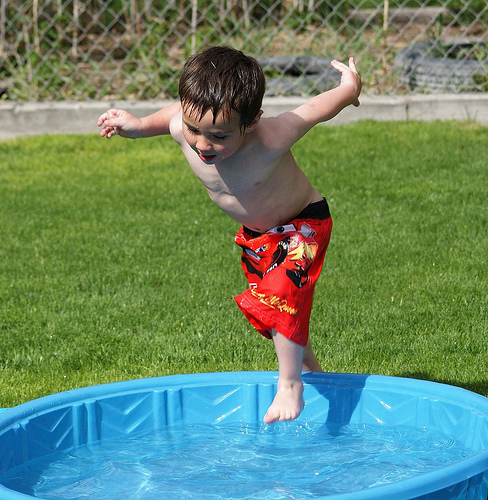

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Flicker8k_Dataset/2196846255_2c1635359a.jpg
BELU score: 42.45672557693626
Real Caption: the large brown dog stands in the choppy water
Prediction Caption: brown dog is walking out of the ocean


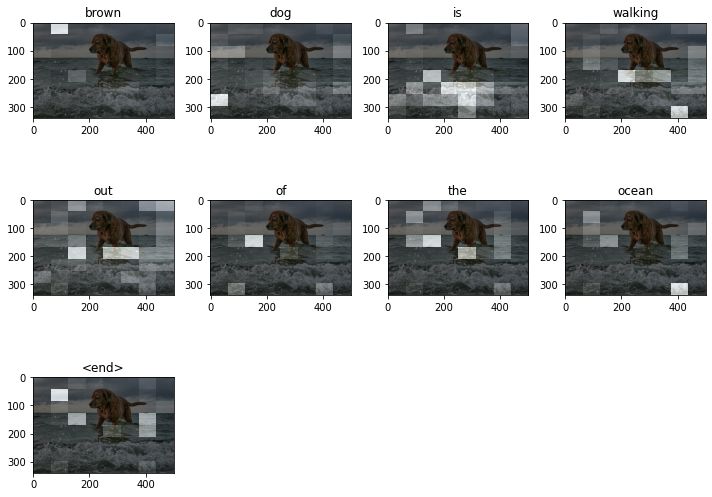

time took to Predict: 2 sec


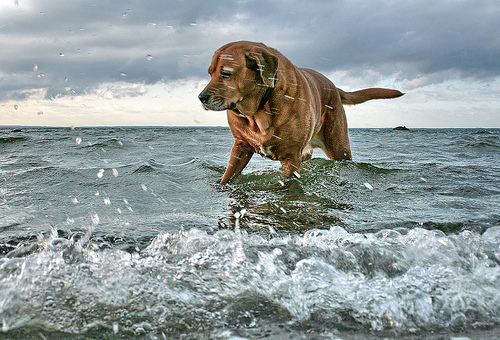

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

BELU score: 16.012815380508712
Real Caption: the large brown dog stands in the choppy water
Prediction Caption: brown dog is walking out of the ocean with stick in its mouth
time took to Predict: 6 sec


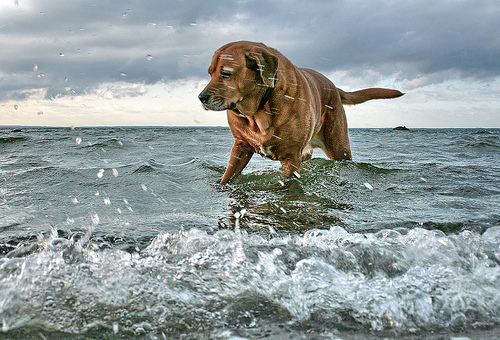

In [ ]:

start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result = beamEvaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)


real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

Prediction Caption: man and woman standing next to tree <end>


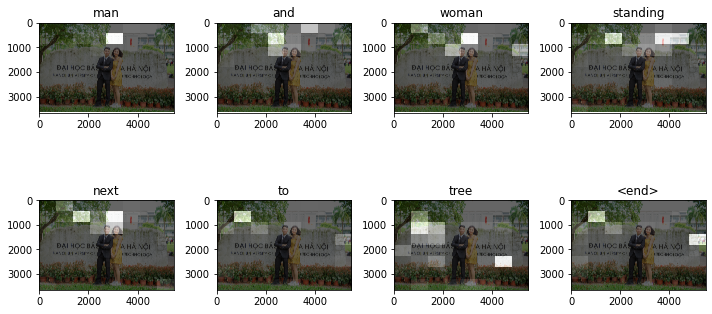

In [ ]:
image_url = '/content/drive/My Drive/Inception/test/IMG_4301.jpg'
# image_extension = image_url[-4:]
# image_path = tf.keras.utils.get_file('image'+image_extension,
#                                      origin=image_url)

result, attention_plot = evaluate(image_url)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_url, result, attention_plot)
# opening the image
#Image.open(image_url)

In [ ]:

start = time.time()

result = beamEvaluate(image_url)


#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)

print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(image_url)

Prediction Caption: man and woman standing next to tree
time took to Predict: 3 sec


Prediction Caption: man with an umbrella <end>


ValueError: ignored

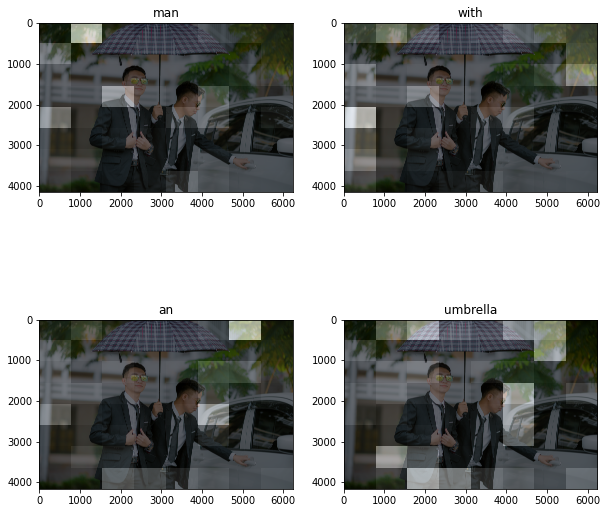

In [ ]:
image_url = '/content/drive/My Drive/Inception/test/IMG_4094.jpg'
# image_extension = image_url[-4:]
# image_path = tf.keras.utils.get_file('image'+image_extension,
#                                      origin=image_url)

result, attention_plot = evaluate(image_url)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_url, result, attention_plot)
# opening the image
#Image.open(image_url)

In [ ]:

start = time.time()

result = beamEvaluate(image_url)


#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
result_final = ' '.join(result)

print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(image_url)

Output hidden; open in https://colab.research.google.com to view.

Prediction Caption: the teacher is working on laptop with computer chair <end>


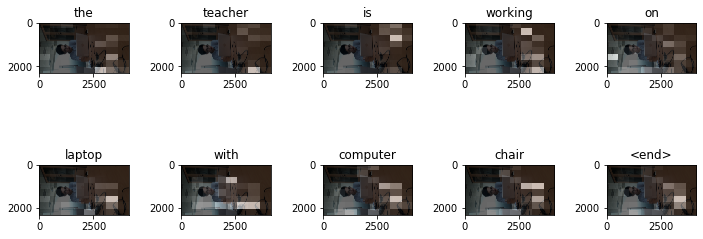

In [ ]:
image_url = '/content/drive/My Drive/Inception/test/khai.jpg'
# image_extension = image_url[-4:]
# image_path = tf.keras.utils.get_file('image'+image_extension,
#                                      origin=image_url)

result, attention_plot = evaluate(image_url)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_url, result, attention_plot)
# opening the image


Prediction Caption: man looking at desk is working on the table <end>


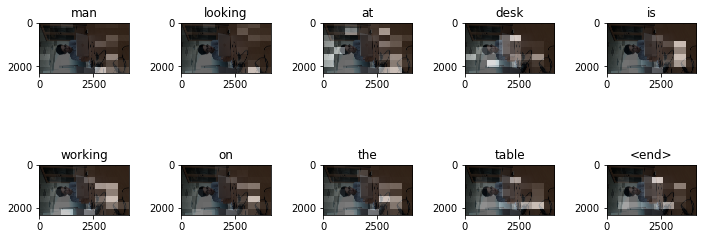

In [ ]:
image_url = '/content/drive/My Drive/Inception/test/khai.jpg'
# image_extension = image_url[-4:]
# image_path = tf.keras.utils.get_file('image'+image_extension,
#                                      origin=image_url)

result, attention_plot = evaluate(image_url)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_url, result, attention_plot)
# opening the image
